In [1]:
#pip install pycaret

In [2]:
#pip install pycaret[full]

In [3]:
# Importing the neccessary libraries
import pandas as pd
import numpy as np 
import warnings
from pycaret.anomaly import *
from sklearn.impute import SimpleImputer

In [4]:
# import the dataset (with missing values)
data = pd.read_excel("SitePerformanceFY2016-FY2021.xlsx")

In [5]:
# View the data - Python automatically assumes NaN for missing values
data.head()

,Operating Unit,PSNU,Facility,Indicator,2016 Q1-R,2016 Q2-R,2016 Q3-R,2016 Q4-R,2017 Q1-R,2017 Q2-R,2017 Q3-R,2017 Q4-R,2018 Q1-R,2018 Q2-R,2018 Q3-R,2018 Q4-R,2019 Q1-R,2019 Q2-R,2019 Q3-R,2019 Q4-R,2020 Q1-R,2020 Q2-R,2020 Q3-R,2020 Q4-R,2021 Q1-R
0,Angola,Benguela,Facility 3fce98,PMTCT_STAT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,450.0
1,Angola,Benguela,Facility 401d5b,PMTCT_STAT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,220.0
2,Angola,Benguela,Facility 5bde81,PMTCT_STAT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,470.0,484.0,440.0,420.0,412.0
3,Angola,Benguela,Facility adbd74,PMTCT_STAT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,293.0,274.0
4,Angola,Benguela,Facility bb12b2,PMTCT_STAT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,203.0


In [6]:
# Runs the number of rows in the dataset
data.shape  

(37307, 25)

In [7]:
#view column headers
data.columns 

Index(['Operating Unit', 'PSNU', 'Facility', 'Indicator', '2016 Q1-R',
       '2016 Q2-R', '2016 Q3-R', '2016 Q4-R', '2017 Q1-R', '2017 Q2-R',
       '2017 Q3-R', '2017 Q4-R', '2018 Q1-R', '2018 Q2-R', '2018 Q3-R',
       '2018 Q4-R', '2019 Q1-R', '2019 Q2-R', '2019 Q3-R', '2019 Q4-R',
       '2020 Q1-R', '2020 Q2-R', '2020 Q3-R', '2020 Q4-R', '2021 Q1-R'],
      dtype='object')

In [8]:
# Summary statistics
data.describe().T

,count,mean,std,min,25%,50%,75%,max
2016 Q1-R,19190.0,145.334289,240.037277,1.0,28.0,71.0,167.0,8018.0
2016 Q2-R,18371.0,158.581623,263.925724,1.0,32.0,79.0,184.0,10370.0
2016 Q3-R,17436.0,155.806894,247.273019,1.0,35.0,83.0,184.0,6992.0
2016 Q4-R,17118.0,152.146571,240.317160,1.0,34.0,79.0,179.0,7152.0
2017 Q1-R,17817.0,144.740473,209.115881,1.0,35.0,80.0,177.0,6218.0
2017 Q2-R,18287.0,154.106196,215.133690,1.0,39.0,89.0,187.0,4742.0
2017 Q3-R,18658.0,142.568442,201.477198,1.0,35.0,80.0,176.0,5202.0
2017 Q4-R,19509.0,151.393049,243.340534,1.0,35.0,83.0,185.0,9997.0
2018 Q1-R,19299.0,139.008601,190.519911,1.0,34.0,78.0,171.0,4394.0
2018 Q2-R,19597.0,154.243762,245.609548,1.0,37.0,84.0,183.0,8892.0


In [9]:
pd.set_option('display.max_columns', 25) 

In [10]:
#show values in descending order
data.tail()

,Operating Unit,PSNU,Facility,Indicator,2016 Q1-R,2016 Q2-R,2016 Q3-R,2016 Q4-R,2017 Q1-R,2017 Q2-R,2017 Q3-R,2017 Q4-R,2018 Q1-R,2018 Q2-R,2018 Q3-R,2018 Q4-R,2019 Q1-R,2019 Q2-R,2019 Q3-R,2019 Q4-R,2020 Q1-R,2020 Q2-R,2020 Q3-R,2020 Q4-R,2021 Q1-R
37302,Zimbabwe,Zvishavane,Facility c21362,PMTCT_STAT,209.0,207.0,190.0,159.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
37303,Zimbabwe,Zvishavane,Facility c282aa,PMTCT_STAT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
37304,Zimbabwe,Zvishavane,Facility cf0fbe,PMTCT_STAT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
37305,Zimbabwe,Zvishavane,Facility d0900d,PMTCT_STAT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
37306,Zimbabwe,Zvishavane,Facility e6d0f2,PMTCT_STAT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [11]:
data.describe(include=['object']).T

,count,unique,top,freq
Operating Unit,37307,22,Nigeria,6397
PSNU,37307,2230,Benue,585
Facility,37305,37270,Facility eedfe3,2
Indicator,37307,1,PMTCT_STAT,37307


In [12]:
# show datatypes of each column
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 37307 entries, 0 to 37306
Data columns (total 25 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Operating Unit  37307 non-null  object 
 1   PSNU            37307 non-null  object 
 2   Facility        37305 non-null  object 
 3   Indicator       37307 non-null  object 
 4   2016 Q1-R       19190 non-null  float64
 5   2016 Q2-R       18371 non-null  float64
 6   2016 Q3-R       17436 non-null  float64
 7   2016 Q4-R       17118 non-null  float64
 8   2017 Q1-R       17817 non-null  float64
 9   2017 Q2-R       18287 non-null  float64
 10  2017 Q3-R       18658 non-null  float64
 11  2017 Q4-R       19509 non-null  float64
 12  2018 Q1-R       19299 non-null  float64
 13  2018 Q2-R       19597 non-null  float64
 14  2018 Q3-R       19921 non-null  float64
 15  2018 Q4-R       21730 non-null  float64
 16  2019 Q1-R       19423 non-null  float64
 17  2019 Q2-R       19434 non-null 

In [13]:
#boolean for null or available values
data.isnull()

,Operating Unit,PSNU,Facility,Indicator,2016 Q1-R,2016 Q2-R,2016 Q3-R,2016 Q4-R,2017 Q1-R,2017 Q2-R,2017 Q3-R,2017 Q4-R,2018 Q1-R,2018 Q2-R,2018 Q3-R,2018 Q4-R,2019 Q1-R,2019 Q2-R,2019 Q3-R,2019 Q4-R,2020 Q1-R,2020 Q2-R,2020 Q3-R,2020 Q4-R,2021 Q1-R
0,False,False,False,False,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,False
1,False,False,False,False,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,False
2,False,False,False,False,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,False,False,False,False,False
3,False,False,False,False,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,False,False
4,False,False,False,False,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
37302,False,False,False,False,False,False,False,False,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True
37303,False,False,False,False,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True
37304,False,False,False,False,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True
37305,False,False,False,False,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True


In [14]:
#show only data with values
data.notnull()

,Operating Unit,PSNU,Facility,Indicator,2016 Q1-R,2016 Q2-R,2016 Q3-R,2016 Q4-R,2017 Q1-R,2017 Q2-R,2017 Q3-R,2017 Q4-R,2018 Q1-R,2018 Q2-R,2018 Q3-R,2018 Q4-R,2019 Q1-R,2019 Q2-R,2019 Q3-R,2019 Q4-R,2020 Q1-R,2020 Q2-R,2020 Q3-R,2020 Q4-R,2021 Q1-R
0,True,True,True,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True
1,True,True,True,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True
2,True,True,True,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,True,True,True,True
3,True,True,True,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,True
4,True,True,True,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
37302,True,True,True,True,True,True,True,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
37303,True,True,True,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
37304,True,True,True,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
37305,True,True,True,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False


## COMPLETENESS

In [15]:
#Show percentage of missing values in data 
# N.B: following WHO DQD - any value below 75% proves data is incomplete
def missing_values(df):
    print(round(df.isnull().sum() * 100 / len(df), 2))#.sort_values())
    
missing_values(data)

Operating Unit     0.00
PSNU               0.00
Facility           0.01
Indicator          0.00
2016 Q1-R         48.56
2016 Q2-R         50.76
2016 Q3-R         53.26
2016 Q4-R         54.12
2017 Q1-R         52.24
2017 Q2-R         50.98
2017 Q3-R         49.99
2017 Q4-R         47.71
2018 Q1-R         48.27
2018 Q2-R         47.47
2018 Q3-R         46.60
2018 Q4-R         41.75
2019 Q1-R         47.94
2019 Q2-R         47.91
2019 Q3-R         47.71
2019 Q4-R         44.57
2020 Q1-R         52.93
2020 Q2-R         52.06
2020 Q3-R         52.50
2020 Q4-R         49.18
2021 Q1-R         51.89
dtype: float64


In [16]:
data.groupby(by='Operating Unit').size()

Operating Unit
Angola                                39
Botswana                             128
Burundi                              514
Cameroon                            2112
Cote d'Ivoire                       1288
Democratic Republic of the Congo     883
Eswatini                             175
Ethiopia                            1951
Kenya                               5073
Lesotho                              201
Malawi                               660
Mozambique                          1590
Namibia                              360
Nigeria                             6397
Rwanda                               224
South Africa                        4458
South Sudan                           78
Tanzania                            5443
Uganda                              2239
West Africa Region                    51
Zambia                              1844
Zimbabwe                            1599
dtype: int64

In [17]:
data.head()

,Operating Unit,PSNU,Facility,Indicator,2016 Q1-R,2016 Q2-R,2016 Q3-R,2016 Q4-R,2017 Q1-R,2017 Q2-R,2017 Q3-R,2017 Q4-R,2018 Q1-R,2018 Q2-R,2018 Q3-R,2018 Q4-R,2019 Q1-R,2019 Q2-R,2019 Q3-R,2019 Q4-R,2020 Q1-R,2020 Q2-R,2020 Q3-R,2020 Q4-R,2021 Q1-R
0,Angola,Benguela,Facility 3fce98,PMTCT_STAT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,450.0
1,Angola,Benguela,Facility 401d5b,PMTCT_STAT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,220.0
2,Angola,Benguela,Facility 5bde81,PMTCT_STAT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,470.0,484.0,440.0,420.0,412.0
3,Angola,Benguela,Facility adbd74,PMTCT_STAT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,293.0,274.0
4,Angola,Benguela,Facility bb12b2,PMTCT_STAT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,203.0


In [18]:
# step 1 to change string to float
data.fillna(0, inplace=False)

,Operating Unit,PSNU,Facility,Indicator,2016 Q1-R,2016 Q2-R,2016 Q3-R,2016 Q4-R,2017 Q1-R,2017 Q2-R,2017 Q3-R,2017 Q4-R,2018 Q1-R,2018 Q2-R,2018 Q3-R,2018 Q4-R,2019 Q1-R,2019 Q2-R,2019 Q3-R,2019 Q4-R,2020 Q1-R,2020 Q2-R,2020 Q3-R,2020 Q4-R,2021 Q1-R
0,Angola,Benguela,Facility 3fce98,PMTCT_STAT,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,450.0
1,Angola,Benguela,Facility 401d5b,PMTCT_STAT,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,220.0
2,Angola,Benguela,Facility 5bde81,PMTCT_STAT,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,470.0,484.0,440.0,420.0,412.0
3,Angola,Benguela,Facility adbd74,PMTCT_STAT,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,293.0,274.0
4,Angola,Benguela,Facility bb12b2,PMTCT_STAT,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,203.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
37302,Zimbabwe,Zvishavane,Facility c21362,PMTCT_STAT,209.0,207.0,190.0,159.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
37303,Zimbabwe,Zvishavane,Facility c282aa,PMTCT_STAT,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
37304,Zimbabwe,Zvishavane,Facility cf0fbe,PMTCT_STAT,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
37305,Zimbabwe,Zvishavane,Facility d0900d,PMTCT_STAT,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [19]:
data.head()

,Operating Unit,PSNU,Facility,Indicator,2016 Q1-R,2016 Q2-R,2016 Q3-R,2016 Q4-R,2017 Q1-R,2017 Q2-R,2017 Q3-R,2017 Q4-R,2018 Q1-R,2018 Q2-R,2018 Q3-R,2018 Q4-R,2019 Q1-R,2019 Q2-R,2019 Q3-R,2019 Q4-R,2020 Q1-R,2020 Q2-R,2020 Q3-R,2020 Q4-R,2021 Q1-R
0,Angola,Benguela,Facility 3fce98,PMTCT_STAT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,450.0
1,Angola,Benguela,Facility 401d5b,PMTCT_STAT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,220.0
2,Angola,Benguela,Facility 5bde81,PMTCT_STAT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,470.0,484.0,440.0,420.0,412.0
3,Angola,Benguela,Facility adbd74,PMTCT_STAT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,293.0,274.0
4,Angola,Benguela,Facility bb12b2,PMTCT_STAT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,203.0


In [20]:
data[['2016 Q1-R','2016 Q2-R', '2016 Q3-R', '2016 Q4-R', '2017 Q1-R', '2017 Q2-R','2017 Q3-R', '2017 Q4-R', '2018 Q1-R', '2018 Q2-R', '2018 Q3-R','2018 Q4-R', '2019 Q1-R', '2019 Q2-R', '2019 Q3-R', '2019 Q4-R','2020 Q1-R', '2020 Q2-R', '2020 Q3-R', '2020 Q4-R', '2021 Q1-R']] = data[['2016 Q1-R','2016 Q2-R', '2016 Q3-R', '2016 Q4-R', '2017 Q1-R', '2017 Q2-R','2017 Q3-R', '2017 Q4-R', '2018 Q1-R', '2018 Q2-R', '2018 Q3-R','2018 Q4-R', '2019 Q1-R', '2019 Q2-R', '2019 Q3-R', '2019 Q4-R','2020 Q1-R', '2020 Q2-R', '2020 Q3-R', '2020 Q4-R', '2021 Q1-R']].apply(pd.to_numeric, errors='coerce')

In [21]:
#view changed data to float
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 37307 entries, 0 to 37306
Data columns (total 25 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Operating Unit  37307 non-null  object 
 1   PSNU            37307 non-null  object 
 2   Facility        37305 non-null  object 
 3   Indicator       37307 non-null  object 
 4   2016 Q1-R       19190 non-null  float64
 5   2016 Q2-R       18371 non-null  float64
 6   2016 Q3-R       17436 non-null  float64
 7   2016 Q4-R       17118 non-null  float64
 8   2017 Q1-R       17817 non-null  float64
 9   2017 Q2-R       18287 non-null  float64
 10  2017 Q3-R       18658 non-null  float64
 11  2017 Q4-R       19509 non-null  float64
 12  2018 Q1-R       19299 non-null  float64
 13  2018 Q2-R       19597 non-null  float64
 14  2018 Q3-R       19921 non-null  float64
 15  2018 Q4-R       21730 non-null  float64
 16  2019 Q1-R       19423 non-null  float64
 17  2019 Q2-R       19434 non-null 

In [22]:
#the cell gives the no of missing values for each operating unit
sum_of_isnull_by_operating_units = data[['2016 Q1-R',
       '2016 Q2-R', '2016 Q3-R', '2016 Q4-R', '2017 Q1-R', '2017 Q2-R',
       '2017 Q3-R', '2017 Q4-R', '2018 Q1-R', '2018 Q2-R', '2018 Q3-R',
       '2018 Q4-R', '2019 Q1-R', '2019 Q2-R', '2019 Q3-R', '2019 Q4-R',
       '2020 Q1-R', '2020 Q2-R', '2020 Q3-R', '2020 Q4-R', '2021 Q1-R']].isnull().groupby(data['Operating Unit']).sum().astype(int)
sum_of_isnull_by_operating_units

,2016 Q1-R,2016 Q2-R,2016 Q3-R,2016 Q4-R,2017 Q1-R,2017 Q2-R,2017 Q3-R,2017 Q4-R,2018 Q1-R,2018 Q2-R,2018 Q3-R,2018 Q4-R,2019 Q1-R,2019 Q2-R,2019 Q3-R,2019 Q4-R,2020 Q1-R,2020 Q2-R,2020 Q3-R,2020 Q4-R,2021 Q1-R
Operating Unit,,,,,,,,,,,,,,,,,,,,,
Angola,39,39,39,39,39,39,39,39,39,39,39,39,39,39,39,39,26,26,26,26,23
Botswana,95,88,85,85,87,58,32,33,33,33,30,29,127,127,127,127,65,65,70,67,64
Burundi,310,308,303,300,312,314,315,314,318,315,317,315,374,374,374,374,287,292,284,286,213
Cameroon,1500,1484,1492,1486,1707,1710,1710,1712,1778,1821,1778,1782,1781,1778,1781,1782,1831,1822,1823,1822,1821
Cote d'Ivoire,839,833,821,809,532,471,419,406,319,240,196,191,120,86,65,129,483,477,478,481,864
Democratic Republic of the Congo,218,220,178,408,386,386,385,383,379,381,380,381,374,379,385,380,383,382,381,381,348
Eswatini,51,45,45,44,57,55,56,51,46,47,44,48,47,48,46,46,33,50,48,51,48
Ethiopia,1080,1076,1088,1057,926,961,940,890,893,900,909,902,1899,1950,1949,1951,1951,1951,1951,1951,1951
Kenya,2126,2063,2182,2215,2143,2151,2095,2856,2100,1959,1864,1875,1852,1882,1826,1938,2248,2275,2307,2289,2227


In [23]:
# Percentage of missing values for Opertional unit for each quarter incompleteness
percent_incompleteness_by_operatingUnit_by_qtr = data[['2016 Q1-R',
       '2016 Q2-R', '2016 Q3-R', '2016 Q4-R', '2017 Q1-R', '2017 Q2-R',
       '2017 Q3-R', '2017 Q4-R', '2018 Q1-R', '2018 Q2-R', '2018 Q3-R',
       '2018 Q4-R', '2019 Q1-R', '2019 Q2-R', '2019 Q3-R', '2019 Q4-R',
       '2020 Q1-R', '2020 Q2-R', '2020 Q3-R', '2020 Q4-R', '2021 Q1-R']].groupby(data['Operating Unit']).apply(lambda x:x.isnull().sum()/len(x)*100)
percent_incompleteness_by_operatingUnit_by_qtr

,2016 Q1-R,2016 Q2-R,2016 Q3-R,2016 Q4-R,2017 Q1-R,2017 Q2-R,2017 Q3-R,2017 Q4-R,2018 Q1-R,2018 Q2-R,2018 Q3-R,2018 Q4-R,2019 Q1-R,2019 Q2-R,2019 Q3-R,2019 Q4-R,2020 Q1-R,2020 Q2-R,2020 Q3-R,2020 Q4-R,2021 Q1-R
Operating Unit,,,,,,,,,,,,,,,,,,,,,
Angola,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,66.666667,66.666667,66.666667,66.666667,58.974359
Botswana,74.218750,68.750000,66.406250,66.406250,67.968750,45.312500,25.000000,25.781250,25.781250,25.781250,23.437500,22.656250,99.218750,99.218750,99.218750,99.218750,50.781250,50.781250,54.687500,52.343750,50.000000
Burundi,60.311284,59.922179,58.949416,58.365759,60.700389,61.089494,61.284047,61.089494,61.867704,61.284047,61.673152,61.284047,72.762646,72.762646,72.762646,72.762646,55.836576,56.809339,55.252918,55.642023,41.439689
Cameroon,71.022727,70.265152,70.643939,70.359848,80.823864,80.965909,80.965909,81.060606,84.185606,86.221591,84.185606,84.375000,84.327652,84.185606,84.327652,84.375000,86.695076,86.268939,86.316288,86.268939,86.221591
Cote d'Ivoire,65.139752,64.673913,63.742236,62.810559,41.304348,36.568323,32.531056,31.521739,24.767081,18.633540,15.217391,14.829193,9.316770,6.677019,5.046584,10.015528,37.500000,37.034161,37.111801,37.344720,67.080745
Democratic Republic of the Congo,24.688562,24.915062,20.158550,46.206116,43.714609,43.714609,43.601359,43.374858,42.921857,43.148358,43.035108,43.148358,42.355606,42.921857,43.601359,43.035108,43.374858,43.261608,43.148358,43.148358,39.411099
Eswatini,29.142857,25.714286,25.714286,25.142857,32.571429,31.428571,32.000000,29.142857,26.285714,26.857143,25.142857,27.428571,26.857143,27.428571,26.285714,26.285714,18.857143,28.571429,27.428571,29.142857,27.428571
Ethiopia,55.356228,55.151205,55.766274,54.177345,47.462840,49.256791,48.180420,45.617632,45.771399,46.130190,46.591492,46.232701,97.334700,99.948744,99.897488,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000
Kenya,41.908141,40.666272,43.012024,43.662527,42.243249,42.400946,41.297063,56.298048,41.395624,38.616203,36.743544,36.960378,36.506998,37.098364,35.994481,38.202247,44.313030,44.845259,45.476050,45.121230,43.899074


In [24]:
# return rows with missing values greater than 25% 

In [25]:
# do a percentage of district with missing values greater than 25%

## IMPUTATION ALGORITHM

In [26]:
# Use Scikit Learn SimpleImputer Algorithm to impute mean as missing value
from sklearn.impute import SimpleImputer #call the algorithm
imr = SimpleImputer(missing_values=np.nan,strategy='mean') #build your strategy
imr = imr.fit(data.iloc[:,5:]) #extract numerical column only and fit it into the algorithm, why algorithm uses numpy, only numerical column allowed
imp_data = imr.transform(data.iloc[:,5:]) #transform yoour result

imp_data = pd.DataFrame(imp_data) # convert ur rst to dataframe
des_data = data.iloc[:,:4] #extract the categorical column
des_data = des_data.to_numpy() # convert the categorical column to numpy array
# data = pd.merge(des_data,imp_data,on='id')
# des_data
arr = np.concatenate((des_data,imp_data),axis=1) # combine the result of Imputer and categorical column to get the data structure back
refined_data = pd.DataFrame(arr) #convert to dataframe
refined_data

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23
0,Angola,Benguela,Facility 3fce98,PMTCT_STAT,158.582,155.807,152.147,144.74,154.106,142.568,151.393,139.009,154.244,141.123,151.663,133.079,140.457,131.622,136.618,135.743,143.185,135.715,150.612,450
1,Angola,Benguela,Facility 401d5b,PMTCT_STAT,158.582,155.807,152.147,144.74,154.106,142.568,151.393,139.009,154.244,141.123,151.663,133.079,140.457,131.622,136.618,135.743,143.185,135.715,150.612,220
2,Angola,Benguela,Facility 5bde81,PMTCT_STAT,158.582,155.807,152.147,144.74,154.106,142.568,151.393,139.009,154.244,141.123,151.663,133.079,140.457,131.622,136.618,470,484,440,420,412
3,Angola,Benguela,Facility adbd74,PMTCT_STAT,158.582,155.807,152.147,144.74,154.106,142.568,151.393,139.009,154.244,141.123,151.663,133.079,140.457,131.622,136.618,135.743,143.185,135.715,293,274
4,Angola,Benguela,Facility bb12b2,PMTCT_STAT,158.582,155.807,152.147,144.74,154.106,142.568,151.393,139.009,154.244,141.123,151.663,133.079,140.457,131.622,136.618,135.743,143.185,135.715,150.612,203
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
37302,Zimbabwe,Zvishavane,Facility c21362,PMTCT_STAT,207,190,159,144.74,154.106,142.568,151.393,139.009,154.244,141.123,151.663,133.079,140.457,131.622,136.618,135.743,143.185,135.715,150.612,138.793
37303,Zimbabwe,Zvishavane,Facility c282aa,PMTCT_STAT,158.582,155.807,152.147,144.74,154.106,142.568,151.393,139.009,154.244,141.123,151.663,133.079,140.457,131.622,136.618,135.743,143.185,135.715,150.612,138.793
37304,Zimbabwe,Zvishavane,Facility cf0fbe,PMTCT_STAT,158.582,155.807,152.147,144.74,154.106,142.568,151.393,139.009,154.244,141.123,151.663,133.079,140.457,131.622,136.618,135.743,143.185,135.715,150.612,138.793
37305,Zimbabwe,Zvishavane,Facility d0900d,PMTCT_STAT,158.582,155.807,152.147,144.74,154.106,142.568,151.393,139.009,154.244,141.123,151.663,133.079,140.457,131.622,136.618,135.743,143.185,135.715,150.612,138.793


In [27]:
#sckitlearn
data[['2016 Q1-R',
       '2016 Q2-R', '2016 Q3-R', '2016 Q4-R', '2017 Q1-R', '2017 Q2-R',
       '2017 Q3-R', '2017 Q4-R', '2018 Q1-R', '2018 Q2-R', '2018 Q3-R',
       '2018 Q4-R', '2019 Q1-R', '2019 Q2-R', '2019 Q3-R', '2019 Q4-R',
       '2020 Q1-R', '2020 Q2-R', '2020 Q3-R', '2020 Q4-R', '2021 Q1-R']].apply(lambda row: row.fillna(row.mean()), axis=1)

,2016 Q1-R,2016 Q2-R,2016 Q3-R,2016 Q4-R,2017 Q1-R,2017 Q2-R,2017 Q3-R,2017 Q4-R,2018 Q1-R,2018 Q2-R,2018 Q3-R,2018 Q4-R,2019 Q1-R,2019 Q2-R,2019 Q3-R,2019 Q4-R,2020 Q1-R,2020 Q2-R,2020 Q3-R,2020 Q4-R,2021 Q1-R
0,450.0,450.0,450.0,450.0,450.00,450.00,450.00,450.00,450.00,450.00,450.00,450.00,450.00,450.00,450.00,450.00,450.00,450.00,450.00,450.00,450.00
1,220.0,220.0,220.0,220.0,220.00,220.00,220.00,220.00,220.00,220.00,220.00,220.00,220.00,220.00,220.00,220.00,220.00,220.00,220.00,220.00,220.00
2,445.2,445.2,445.2,445.2,445.20,445.20,445.20,445.20,445.20,445.20,445.20,445.20,445.20,445.20,445.20,445.20,470.00,484.00,440.00,420.00,412.00
3,283.5,283.5,283.5,283.5,283.50,283.50,283.50,283.50,283.50,283.50,283.50,283.50,283.50,283.50,283.50,283.50,283.50,283.50,283.50,293.00,274.00
4,203.0,203.0,203.0,203.0,203.00,203.00,203.00,203.00,203.00,203.00,203.00,203.00,203.00,203.00,203.00,203.00,203.00,203.00,203.00,203.00,203.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
37302,209.0,207.0,190.0,159.0,191.25,191.25,191.25,191.25,191.25,191.25,191.25,191.25,191.25,191.25,191.25,191.25,191.25,191.25,191.25,191.25,191.25
37303,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
37304,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
37305,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [28]:
data.head()

,Operating Unit,PSNU,Facility,Indicator,2016 Q1-R,2016 Q2-R,2016 Q3-R,2016 Q4-R,2017 Q1-R,2017 Q2-R,2017 Q3-R,2017 Q4-R,2018 Q1-R,2018 Q2-R,2018 Q3-R,2018 Q4-R,2019 Q1-R,2019 Q2-R,2019 Q3-R,2019 Q4-R,2020 Q1-R,2020 Q2-R,2020 Q3-R,2020 Q4-R,2021 Q1-R
0,Angola,Benguela,Facility 3fce98,PMTCT_STAT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,450.0
1,Angola,Benguela,Facility 401d5b,PMTCT_STAT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,220.0
2,Angola,Benguela,Facility 5bde81,PMTCT_STAT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,470.0,484.0,440.0,420.0,412.0
3,Angola,Benguela,Facility adbd74,PMTCT_STAT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,293.0,274.0
4,Angola,Benguela,Facility bb12b2,PMTCT_STAT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,203.0


In [29]:
data.tail() 

,Operating Unit,PSNU,Facility,Indicator,2016 Q1-R,2016 Q2-R,2016 Q3-R,2016 Q4-R,2017 Q1-R,2017 Q2-R,2017 Q3-R,2017 Q4-R,2018 Q1-R,2018 Q2-R,2018 Q3-R,2018 Q4-R,2019 Q1-R,2019 Q2-R,2019 Q3-R,2019 Q4-R,2020 Q1-R,2020 Q2-R,2020 Q3-R,2020 Q4-R,2021 Q1-R
37302,Zimbabwe,Zvishavane,Facility c21362,PMTCT_STAT,209.0,207.0,190.0,159.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
37303,Zimbabwe,Zvishavane,Facility c282aa,PMTCT_STAT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
37304,Zimbabwe,Zvishavane,Facility cf0fbe,PMTCT_STAT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
37305,Zimbabwe,Zvishavane,Facility d0900d,PMTCT_STAT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
37306,Zimbabwe,Zvishavane,Facility e6d0f2,PMTCT_STAT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [30]:
data.isnull()

,Operating Unit,PSNU,Facility,Indicator,2016 Q1-R,2016 Q2-R,2016 Q3-R,2016 Q4-R,2017 Q1-R,2017 Q2-R,2017 Q3-R,2017 Q4-R,2018 Q1-R,2018 Q2-R,2018 Q3-R,2018 Q4-R,2019 Q1-R,2019 Q2-R,2019 Q3-R,2019 Q4-R,2020 Q1-R,2020 Q2-R,2020 Q3-R,2020 Q4-R,2021 Q1-R
0,False,False,False,False,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,False
1,False,False,False,False,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,False
2,False,False,False,False,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,False,False,False,False,False
3,False,False,False,False,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,False,False
4,False,False,False,False,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
37302,False,False,False,False,False,False,False,False,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True
37303,False,False,False,False,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True
37304,False,False,False,False,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True
37305,False,False,False,False,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True


In [31]:
def missing_values(df):
    print(round(df.isnull().sum() * 100 / len(df), 2).sort_values())
    
missing_values(data)

Operating Unit     0.00
PSNU               0.00
Indicator          0.00
Facility           0.01
2018 Q4-R         41.75
2019 Q4-R         44.57
2018 Q3-R         46.60
2018 Q2-R         47.47
2019 Q3-R         47.71
2017 Q4-R         47.71
2019 Q2-R         47.91
2019 Q1-R         47.94
2018 Q1-R         48.27
2016 Q1-R         48.56
2020 Q4-R         49.18
2017 Q3-R         49.99
2016 Q2-R         50.76
2017 Q2-R         50.98
2021 Q1-R         51.89
2020 Q2-R         52.06
2017 Q1-R         52.24
2020 Q3-R         52.50
2020 Q1-R         52.93
2016 Q3-R         53.26
2016 Q4-R         54.12
dtype: float64


In [32]:
data.dropna(inplace=True)

In [33]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 9107 entries, 197 to 37290
Data columns (total 25 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Operating Unit  9107 non-null   object 
 1   PSNU            9107 non-null   object 
 2   Facility        9107 non-null   object 
 3   Indicator       9107 non-null   object 
 4   2016 Q1-R       9107 non-null   float64
 5   2016 Q2-R       9107 non-null   float64
 6   2016 Q3-R       9107 non-null   float64
 7   2016 Q4-R       9107 non-null   float64
 8   2017 Q1-R       9107 non-null   float64
 9   2017 Q2-R       9107 non-null   float64
 10  2017 Q3-R       9107 non-null   float64
 11  2017 Q4-R       9107 non-null   float64
 12  2018 Q1-R       9107 non-null   float64
 13  2018 Q2-R       9107 non-null   float64
 14  2018 Q3-R       9107 non-null   float64
 15  2018 Q4-R       9107 non-null   float64
 16  2019 Q1-R       9107 non-null   float64
 17  2019 Q2-R       9107 non-null 

In [34]:
data.head()

,Operating Unit,PSNU,Facility,Indicator,2016 Q1-R,2016 Q2-R,2016 Q3-R,2016 Q4-R,2017 Q1-R,2017 Q2-R,2017 Q3-R,2017 Q4-R,2018 Q1-R,2018 Q2-R,2018 Q3-R,2018 Q4-R,2019 Q1-R,2019 Q2-R,2019 Q3-R,2019 Q4-R,2020 Q1-R,2020 Q2-R,2020 Q3-R,2020 Q4-R,2021 Q1-R
197,Burundi,DS Bujumbura centre,Facility 0268ce,PMTCT_STAT,192.0,216.0,254.0,277.0,316.0,313.0,351.0,305.0,172.0,196.0,181.0,187.0,199.0,188.0,183.0,157.0,144.0,171.0,113.0,156.0,153.0
198,Burundi,DS Bujumbura centre,Facility 0a6250,PMTCT_STAT,106.0,120.0,162.0,105.0,184.0,223.0,181.0,214.0,116.0,132.0,154.0,141.0,112.0,110.0,121.0,112.0,258.0,133.0,134.0,110.0,112.0
199,Burundi,DS Bujumbura centre,Facility 15f1bc,PMTCT_STAT,385.0,468.0,466.0,407.0,458.0,517.0,502.0,396.0,365.0,407.0,413.0,429.0,424.0,420.0,330.0,271.0,144.0,248.0,107.0,213.0,296.0
200,Burundi,DS Bujumbura centre,Facility 179794,PMTCT_STAT,523.0,544.0,531.0,538.0,553.0,550.0,482.0,431.0,334.0,392.0,349.0,329.0,271.0,295.0,332.0,358.0,316.0,360.0,293.0,274.0,305.0
203,Burundi,DS Bujumbura centre,Facility 1fba64,PMTCT_STAT,10.0,15.0,5.0,4.0,10.0,10.0,5.0,7.0,8.0,5.0,8.0,13.0,9.0,7.0,5.0,6.0,4.0,3.0,4.0,4.0,3.0


In [35]:
data.columns

Index(['Operating Unit', 'PSNU', 'Facility', 'Indicator', '2016 Q1-R',
       '2016 Q2-R', '2016 Q3-R', '2016 Q4-R', '2017 Q1-R', '2017 Q2-R',
       '2017 Q3-R', '2017 Q4-R', '2018 Q1-R', '2018 Q2-R', '2018 Q3-R',
       '2018 Q4-R', '2019 Q1-R', '2019 Q2-R', '2019 Q3-R', '2019 Q4-R',
       '2020 Q1-R', '2020 Q2-R', '2020 Q3-R', '2020 Q4-R', '2021 Q1-R'],
      dtype='object')

In [36]:
data = setup(data=data, ignore_features=['Operating Unit', 'PSNU', 'Facility', 'Indicator'])

,Description,Value
0,session_id,3819
1,Original Data,"(9107, 25)"
2,Missing Values,False
3,Numeric Features,21
4,Categorical Features,0
5,Ordinal Features,False
6,High Cardinality Features,False
7,High Cardinality Method,None
8,Transformed Data,"(9107, 21)"
9,CPU Jobs,-1


In [37]:
#step 1 to detect rows with outliers
get_config('X')  

,2016 Q1-R,2016 Q2-R,2016 Q3-R,2016 Q4-R,2017 Q1-R,2017 Q2-R,2017 Q3-R,2017 Q4-R,2018 Q1-R,2018 Q2-R,...,2018 Q4-R,2019 Q1-R,2019 Q2-R,2019 Q3-R,2019 Q4-R,2020 Q1-R,2020 Q2-R,2020 Q3-R,2020 Q4-R,2021 Q1-R
197,192.0,216.0,254.0,277.0,316.0,313.0,351.0,305.0,172.0,196.0,...,187.0,199.0,188.0,183.0,157.0,144.0,171.0,113.0,156.0,153.0
198,106.0,120.0,162.0,105.0,184.0,223.0,181.0,214.0,116.0,132.0,...,141.0,112.0,110.0,121.0,112.0,258.0,133.0,134.0,110.0,112.0
199,385.0,468.0,466.0,407.0,458.0,517.0,502.0,396.0,365.0,407.0,...,429.0,424.0,420.0,330.0,271.0,144.0,248.0,107.0,213.0,296.0
200,523.0,544.0,531.0,538.0,553.0,550.0,482.0,431.0,334.0,392.0,...,329.0,271.0,295.0,332.0,358.0,316.0,360.0,293.0,274.0,305.0
203,10.0,15.0,5.0,4.0,10.0,10.0,5.0,7.0,8.0,5.0,...,13.0,9.0,7.0,5.0,6.0,4.0,3.0,4.0,4.0,3.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
37281,72.0,77.0,80.0,76.0,72.0,99.0,85.0,79.0,84.0,92.0,...,116.0,110.0,116.0,78.0,79.0,81.0,95.0,53.0,117.0,83.0
37282,61.0,58.0,69.0,55.0,46.0,70.0,68.0,79.0,57.0,82.0,...,53.0,59.0,56.0,73.0,54.0,46.0,78.0,44.0,45.0,76.0
37285,119.0,150.0,113.0,140.0,149.0,138.0,139.0,139.0,121.0,132.0,...,146.0,121.0,133.0,115.0,101.0,99.0,134.0,62.0,98.0,144.0
37287,62.0,85.0,63.0,66.0,61.0,83.0,80.0,96.0,89.0,139.0,...,134.0,130.0,134.0,106.0,121.0,111.0,84.0,29.0,98.0,55.0


In [38]:
#Auto select model for anomaly detection
models()

,Name,Reference
ID,,
abod,Angle-base Outlier Detection,pyod.models.abod.ABOD
cluster,Clustering-Based Local Outlier,pyod.models.cblof.CBLOF
cof,Connectivity-Based Local Outlier,pyod.models.cof.COF
iforest,Isolation Forest,pyod.models.iforest.IForest
histogram,Histogram-based Outlier Detection,pyod.models.hbos.HBOS
knn,K-Nearest Neighbors Detector,pyod.models.knn.KNN
lof,Local Outlier Factor,pyod.models.lof.LOF
svm,One-class SVM detector,pyod.models.ocsvm.OCSVM
pca,Principal Component Analysis,pyod.models.pca.PCA


In [39]:
model = create_model('iforest')

In [40]:
plot_model(model, plot='umap')

In [41]:
plot_model(model)  

In [42]:
plt = assign_model(model)

In [43]:
plt[plt['Anomaly']==1]['Anomaly'].value_counts()

1    456
Name: Anomaly, dtype: int64

In [44]:
plt[plt['Anomaly']==0]['Anomaly'].value_counts()

0    8651
Name: Anomaly, dtype: int64

<AxesSubplot:>

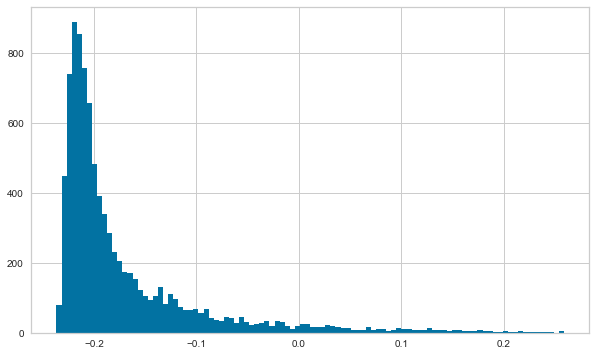

In [45]:
plt['Anomaly_Score'].hist(bins = 100, figsize=(10, 6))

In [46]:
plt.head()

,Operating Unit,PSNU,Facility,Indicator,2016 Q1-R,2016 Q2-R,2016 Q3-R,2016 Q4-R,2017 Q1-R,2017 Q2-R,...,2019 Q2-R,2019 Q3-R,2019 Q4-R,2020 Q1-R,2020 Q2-R,2020 Q3-R,2020 Q4-R,2021 Q1-R,Anomaly,Anomaly_Score
197,Burundi,DS Bujumbura centre,Facility 0268ce,PMTCT_STAT,192.0,216.0,254.0,277.0,316.0,313.0,...,188.0,183.0,157.0,144.0,171.0,113.0,156.0,153.0,0,-0.157327
198,Burundi,DS Bujumbura centre,Facility 0a6250,PMTCT_STAT,106.0,120.0,162.0,105.0,184.0,223.0,...,110.0,121.0,112.0,258.0,133.0,134.0,110.0,112.0,0,-0.199055
199,Burundi,DS Bujumbura centre,Facility 15f1bc,PMTCT_STAT,385.0,468.0,466.0,407.0,458.0,517.0,...,420.0,330.0,271.0,144.0,248.0,107.0,213.0,296.0,0,-0.091830
200,Burundi,DS Bujumbura centre,Facility 179794,PMTCT_STAT,523.0,544.0,531.0,538.0,553.0,550.0,...,295.0,332.0,358.0,316.0,360.0,293.0,274.0,305.0,0,-0.079059
203,Burundi,DS Bujumbura centre,Facility 1fba64,PMTCT_STAT,10.0,15.0,5.0,4.0,10.0,10.0,...,7.0,5.0,6.0,4.0,3.0,4.0,4.0,3.0,0,-0.158209


In [47]:
pd.set_option('display.max_columns', 27) 

In [48]:
plt[plt['Anomaly']==1]

,Operating Unit,PSNU,Facility,Indicator,2016 Q1-R,2016 Q2-R,2016 Q3-R,2016 Q4-R,2017 Q1-R,2017 Q2-R,2017 Q3-R,2017 Q4-R,2018 Q1-R,2018 Q2-R,2018 Q3-R,2018 Q4-R,2019 Q1-R,2019 Q2-R,2019 Q3-R,2019 Q4-R,2020 Q1-R,2020 Q2-R,2020 Q3-R,2020 Q4-R,2021 Q1-R,Anomaly,Anomaly_Score
215,Burundi,DS Bujumbura nord,Facility 04a6b7,PMTCT_STAT,818.0,930.0,853.0,740.0,684.0,961.0,1041.0,1137.0,674.0,686.0,641.0,636.0,652.0,166.0,297.0,386.0,247.0,388.0,404.0,447.0,551.0,1,0.048455
217,Burundi,DS Bujumbura nord,Facility 1d9a6f,PMTCT_STAT,1026.0,1103.0,893.0,911.0,841.0,953.0,1053.0,998.0,745.0,558.0,568.0,550.0,568.0,523.0,500.0,297.0,315.0,486.0,559.0,617.0,633.0,1,0.072130
230,Burundi,DS Bujumbura sud,Facility 174ff7,PMTCT_STAT,658.0,629.0,630.0,606.0,635.0,798.0,833.0,686.0,426.0,466.0,425.0,418.0,496.0,412.0,83.0,91.0,146.0,31.0,127.0,106.0,190.0,1,0.029375
575,Burundi,DS Ngozi,Facility 7e274d,PMTCT_STAT,583.0,716.0,684.0,884.0,1223.0,793.0,677.0,625.0,440.0,455.0,423.0,467.0,464.0,474.0,505.0,478.0,521.0,547.0,458.0,427.0,520.0,1,0.008184
862,Cameroon,Bamenda,Facility 93cee8,PMTCT_STAT,739.0,807.0,795.0,709.0,782.0,280.0,701.0,717.0,648.0,677.0,750.0,662.0,645.0,681.0,591.0,484.0,506.0,502.0,530.0,407.0,428.0,1,0.015669
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
36310,Zimbabwe,Harare,Facility 69141c,PMTCT_STAT,1021.0,997.0,901.0,864.0,716.0,868.0,1012.0,759.0,719.0,787.0,735.0,832.0,754.0,754.0,776.0,683.0,354.0,851.0,607.0,180.0,456.0,1,0.071049
36317,Zimbabwe,Harare,Facility 9721ac,PMTCT_STAT,783.0,779.0,637.0,620.0,469.0,703.0,685.0,663.0,576.0,607.0,625.0,673.0,714.0,721.0,468.0,641.0,467.0,738.0,510.0,747.0,718.0,1,0.007961
36329,Zimbabwe,Harare,Facility e60d7d,PMTCT_STAT,1164.0,1306.0,1216.0,1189.0,708.0,1170.0,759.0,1200.0,1122.0,1016.0,1179.0,1084.0,1046.0,1016.0,1064.0,1073.0,610.0,950.0,862.0,1066.0,1076.0,1,0.144297
36332,Zimbabwe,Harare,Facility ef1632,PMTCT_STAT,879.0,953.0,648.0,916.0,644.0,874.0,513.0,848.0,749.0,780.0,839.0,673.0,622.0,944.0,995.0,792.0,509.0,1179.0,648.0,467.0,663.0,1,0.069778


In [49]:
knn = create_model('knn')

In [50]:
plot_model(knn, plot='umap')

In [51]:
plot_model(knn)  

In [52]:
plot = assign_model(knn)

In [53]:
plot[plot['Anomaly']==1]['Anomaly'].value_counts()

1    456
Name: Anomaly, dtype: int64

In [54]:
plot[plot['Anomaly']==0]['Anomaly'].value_counts()

0    8651
Name: Anomaly, dtype: int64

<AxesSubplot:>

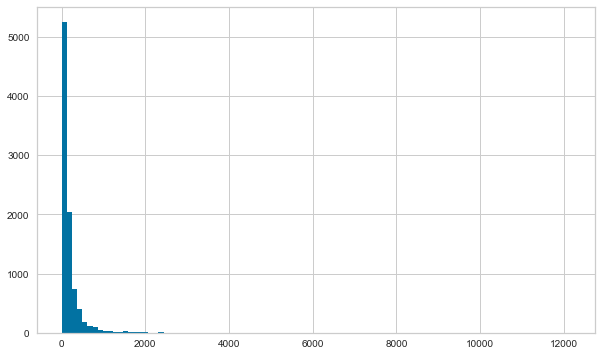

In [55]:
plot['Anomaly_Score'].hist(bins = 100, figsize=(10, 6))

In [56]:
plot.head()

,Operating Unit,PSNU,Facility,Indicator,2016 Q1-R,2016 Q2-R,2016 Q3-R,2016 Q4-R,2017 Q1-R,2017 Q2-R,2017 Q3-R,2017 Q4-R,2018 Q1-R,2018 Q2-R,2018 Q3-R,2018 Q4-R,2019 Q1-R,2019 Q2-R,2019 Q3-R,2019 Q4-R,2020 Q1-R,2020 Q2-R,2020 Q3-R,2020 Q4-R,2021 Q1-R,Anomaly,Anomaly_Score
197,Burundi,DS Bujumbura centre,Facility 0268ce,PMTCT_STAT,192.0,216.0,254.0,277.0,316.0,313.0,351.0,305.0,172.0,196.0,181.0,187.0,199.0,188.0,183.0,157.0,144.0,171.0,113.0,156.0,153.0,0,226.916284
198,Burundi,DS Bujumbura centre,Facility 0a6250,PMTCT_STAT,106.0,120.0,162.0,105.0,184.0,223.0,181.0,214.0,116.0,132.0,154.0,141.0,112.0,110.0,121.0,112.0,258.0,133.0,134.0,110.0,112.0,0,170.528590
199,Burundi,DS Bujumbura centre,Facility 15f1bc,PMTCT_STAT,385.0,468.0,466.0,407.0,458.0,517.0,502.0,396.0,365.0,407.0,413.0,429.0,424.0,420.0,330.0,271.0,144.0,248.0,107.0,213.0,296.0,0,387.413216
200,Burundi,DS Bujumbura centre,Facility 179794,PMTCT_STAT,523.0,544.0,531.0,538.0,553.0,550.0,482.0,431.0,334.0,392.0,349.0,329.0,271.0,295.0,332.0,358.0,316.0,360.0,293.0,274.0,305.0,0,341.375160
203,Burundi,DS Bujumbura centre,Facility 1fba64,PMTCT_STAT,10.0,15.0,5.0,4.0,10.0,10.0,5.0,7.0,8.0,5.0,8.0,13.0,9.0,7.0,5.0,6.0,4.0,3.0,4.0,4.0,3.0,0,16.703293


In [57]:
pd.set_option('display.max_columns', 27) 

In [58]:
plot[plot['Anomaly']==1]

,Operating Unit,PSNU,Facility,Indicator,2016 Q1-R,2016 Q2-R,2016 Q3-R,2016 Q4-R,2017 Q1-R,2017 Q2-R,2017 Q3-R,2017 Q4-R,2018 Q1-R,2018 Q2-R,2018 Q3-R,2018 Q4-R,2019 Q1-R,2019 Q2-R,2019 Q3-R,2019 Q4-R,2020 Q1-R,2020 Q2-R,2020 Q3-R,2020 Q4-R,2021 Q1-R,Anomaly,Anomaly_Score
215,Burundi,DS Bujumbura nord,Facility 04a6b7,PMTCT_STAT,818.0,930.0,853.0,740.0,684.0,961.0,1041.0,1137.0,674.0,686.0,641.0,636.0,652.0,166.0,297.0,386.0,247.0,388.0,404.0,447.0,551.0,1,925.609529
217,Burundi,DS Bujumbura nord,Facility 1d9a6f,PMTCT_STAT,1026.0,1103.0,893.0,911.0,841.0,953.0,1053.0,998.0,745.0,558.0,568.0,550.0,568.0,523.0,500.0,297.0,315.0,486.0,559.0,617.0,633.0,1,810.003086
230,Burundi,DS Bujumbura sud,Facility 174ff7,PMTCT_STAT,658.0,629.0,630.0,606.0,635.0,798.0,833.0,686.0,426.0,466.0,425.0,418.0,496.0,412.0,83.0,91.0,146.0,31.0,127.0,106.0,190.0,1,742.674222
232,Burundi,DS Bujumbura sud,Facility 2d09a5,PMTCT_STAT,884.0,639.0,505.0,745.0,435.0,555.0,457.0,510.0,299.0,337.0,300.0,297.0,211.0,226.0,162.0,54.0,77.0,48.0,97.0,86.0,225.0,1,676.502033
361,Burundi,DS Isale,Facility 2b17f8,PMTCT_STAT,465.0,780.0,793.0,408.0,523.0,931.0,586.0,373.0,233.0,211.0,215.0,302.0,312.0,336.0,209.0,201.0,164.0,164.0,204.0,284.0,375.0,1,677.104866
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
36302,Zimbabwe,Harare,Facility 2ee420,PMTCT_STAT,733.0,773.0,666.0,687.0,610.0,793.0,685.0,673.0,732.0,690.0,655.0,703.0,683.0,760.0,849.0,672.0,450.0,859.0,709.0,198.0,269.0,1,653.377379
36310,Zimbabwe,Harare,Facility 69141c,PMTCT_STAT,1021.0,997.0,901.0,864.0,716.0,868.0,1012.0,759.0,719.0,787.0,735.0,832.0,754.0,754.0,776.0,683.0,354.0,851.0,607.0,180.0,456.0,1,746.430171
36329,Zimbabwe,Harare,Facility e60d7d,PMTCT_STAT,1164.0,1306.0,1216.0,1189.0,708.0,1170.0,759.0,1200.0,1122.0,1016.0,1179.0,1084.0,1046.0,1016.0,1064.0,1073.0,610.0,950.0,862.0,1066.0,1076.0,1,899.233007
36332,Zimbabwe,Harare,Facility ef1632,PMTCT_STAT,879.0,953.0,648.0,916.0,644.0,874.0,513.0,848.0,749.0,780.0,839.0,673.0,622.0,944.0,995.0,792.0,509.0,1179.0,648.0,467.0,663.0,1,778.791371


In [59]:
lof = create_model('lof')

In [60]:
plot_model(lof, plot='umap')

In [61]:
plot_model(lof)  

In [62]:
plof = assign_model(lof)

In [63]:
plof[plof['Anomaly']==1]['Anomaly'].value_counts()

1    456
Name: Anomaly, dtype: int64

In [64]:
plof[plof['Anomaly']==0]['Anomaly'].value_counts()

0    8651
Name: Anomaly, dtype: int64

<AxesSubplot:>

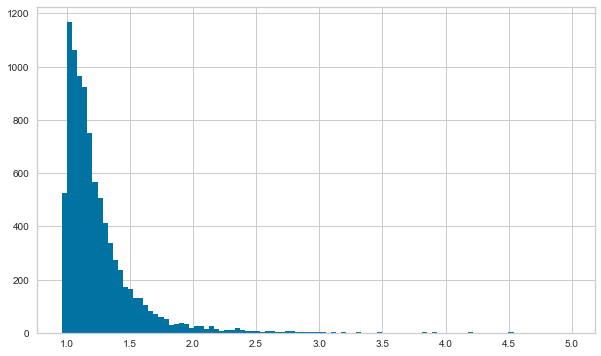

In [65]:
plof['Anomaly_Score'].hist(bins = 100, figsize=(10, 6))

In [66]:
plof.head()

,Operating Unit,PSNU,Facility,Indicator,2016 Q1-R,2016 Q2-R,2016 Q3-R,2016 Q4-R,2017 Q1-R,2017 Q2-R,2017 Q3-R,2017 Q4-R,2018 Q1-R,2018 Q2-R,2018 Q3-R,2018 Q4-R,2019 Q1-R,2019 Q2-R,2019 Q3-R,2019 Q4-R,2020 Q1-R,2020 Q2-R,2020 Q3-R,2020 Q4-R,2021 Q1-R,Anomaly,Anomaly_Score
197,Burundi,DS Bujumbura centre,Facility 0268ce,PMTCT_STAT,192.0,216.0,254.0,277.0,316.0,313.0,351.0,305.0,172.0,196.0,181.0,187.0,199.0,188.0,183.0,157.0,144.0,171.0,113.0,156.0,153.0,0,1.206212
198,Burundi,DS Bujumbura centre,Facility 0a6250,PMTCT_STAT,106.0,120.0,162.0,105.0,184.0,223.0,181.0,214.0,116.0,132.0,154.0,141.0,112.0,110.0,121.0,112.0,258.0,133.0,134.0,110.0,112.0,0,1.425780
199,Burundi,DS Bujumbura centre,Facility 15f1bc,PMTCT_STAT,385.0,468.0,466.0,407.0,458.0,517.0,502.0,396.0,365.0,407.0,413.0,429.0,424.0,420.0,330.0,271.0,144.0,248.0,107.0,213.0,296.0,0,1.296066
200,Burundi,DS Bujumbura centre,Facility 179794,PMTCT_STAT,523.0,544.0,531.0,538.0,553.0,550.0,482.0,431.0,334.0,392.0,349.0,329.0,271.0,295.0,332.0,358.0,316.0,360.0,293.0,274.0,305.0,0,1.092678
203,Burundi,DS Bujumbura centre,Facility 1fba64,PMTCT_STAT,10.0,15.0,5.0,4.0,10.0,10.0,5.0,7.0,8.0,5.0,8.0,13.0,9.0,7.0,5.0,6.0,4.0,3.0,4.0,4.0,3.0,0,1.025666


In [67]:
pd.set_option('display.max_columns', 27) 

In [68]:
plot[plot['Anomaly']==1]

,Operating Unit,PSNU,Facility,Indicator,2016 Q1-R,2016 Q2-R,2016 Q3-R,2016 Q4-R,2017 Q1-R,2017 Q2-R,2017 Q3-R,2017 Q4-R,2018 Q1-R,2018 Q2-R,2018 Q3-R,2018 Q4-R,2019 Q1-R,2019 Q2-R,2019 Q3-R,2019 Q4-R,2020 Q1-R,2020 Q2-R,2020 Q3-R,2020 Q4-R,2021 Q1-R,Anomaly,Anomaly_Score
215,Burundi,DS Bujumbura nord,Facility 04a6b7,PMTCT_STAT,818.0,930.0,853.0,740.0,684.0,961.0,1041.0,1137.0,674.0,686.0,641.0,636.0,652.0,166.0,297.0,386.0,247.0,388.0,404.0,447.0,551.0,1,925.609529
217,Burundi,DS Bujumbura nord,Facility 1d9a6f,PMTCT_STAT,1026.0,1103.0,893.0,911.0,841.0,953.0,1053.0,998.0,745.0,558.0,568.0,550.0,568.0,523.0,500.0,297.0,315.0,486.0,559.0,617.0,633.0,1,810.003086
230,Burundi,DS Bujumbura sud,Facility 174ff7,PMTCT_STAT,658.0,629.0,630.0,606.0,635.0,798.0,833.0,686.0,426.0,466.0,425.0,418.0,496.0,412.0,83.0,91.0,146.0,31.0,127.0,106.0,190.0,1,742.674222
232,Burundi,DS Bujumbura sud,Facility 2d09a5,PMTCT_STAT,884.0,639.0,505.0,745.0,435.0,555.0,457.0,510.0,299.0,337.0,300.0,297.0,211.0,226.0,162.0,54.0,77.0,48.0,97.0,86.0,225.0,1,676.502033
361,Burundi,DS Isale,Facility 2b17f8,PMTCT_STAT,465.0,780.0,793.0,408.0,523.0,931.0,586.0,373.0,233.0,211.0,215.0,302.0,312.0,336.0,209.0,201.0,164.0,164.0,204.0,284.0,375.0,1,677.104866
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
36302,Zimbabwe,Harare,Facility 2ee420,PMTCT_STAT,733.0,773.0,666.0,687.0,610.0,793.0,685.0,673.0,732.0,690.0,655.0,703.0,683.0,760.0,849.0,672.0,450.0,859.0,709.0,198.0,269.0,1,653.377379
36310,Zimbabwe,Harare,Facility 69141c,PMTCT_STAT,1021.0,997.0,901.0,864.0,716.0,868.0,1012.0,759.0,719.0,787.0,735.0,832.0,754.0,754.0,776.0,683.0,354.0,851.0,607.0,180.0,456.0,1,746.430171
36329,Zimbabwe,Harare,Facility e60d7d,PMTCT_STAT,1164.0,1306.0,1216.0,1189.0,708.0,1170.0,759.0,1200.0,1122.0,1016.0,1179.0,1084.0,1046.0,1016.0,1064.0,1073.0,610.0,950.0,862.0,1066.0,1076.0,1,899.233007
36332,Zimbabwe,Harare,Facility ef1632,PMTCT_STAT,879.0,953.0,648.0,916.0,644.0,874.0,513.0,848.0,749.0,780.0,839.0,673.0,622.0,944.0,995.0,792.0,509.0,1179.0,648.0,467.0,663.0,1,778.791371


## Consistency with Time

In [70]:
import pandas as pd
dt = plt.melt(id_vars= ['Operating Unit','PSNU','Facility','Indicator', 'Anomaly', 'Anomaly_Score'], var_name='PEPFAR QUARTER', value_name= 'Value')
dt

,Operating Unit,PSNU,Facility,Indicator,Anomaly,Anomaly_Score,PEPFAR QUARTER,Value
0,Burundi,DS Bujumbura centre,Facility 0268ce,PMTCT_STAT,0,-0.157327,2016 Q1-R,192.0
1,Burundi,DS Bujumbura centre,Facility 0a6250,PMTCT_STAT,0,-0.199055,2016 Q1-R,106.0
2,Burundi,DS Bujumbura centre,Facility 15f1bc,PMTCT_STAT,0,-0.091830,2016 Q1-R,385.0
3,Burundi,DS Bujumbura centre,Facility 179794,PMTCT_STAT,0,-0.079059,2016 Q1-R,523.0
4,Burundi,DS Bujumbura centre,Facility 1fba64,PMTCT_STAT,0,-0.158209,2016 Q1-R,10.0
...,...,...,...,...,...,...,...,...
191242,Zimbabwe,Zvimba,Facility 9d7a62,PMTCT_STAT,0,-0.225020,2021 Q1-R,83.0
191243,Zimbabwe,Zvimba,Facility a64633,PMTCT_STAT,0,-0.227175,2021 Q1-R,76.0
191244,Zimbabwe,Zvimba,Facility c7f74d,PMTCT_STAT,0,-0.218437,2021 Q1-R,144.0
191245,Zimbabwe,Zvimba,Facility d325be,PMTCT_STAT,0,-0.202324,2021 Q1-R,55.0


In [71]:
dt.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 191247 entries, 0 to 191246
Data columns (total 8 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   Operating Unit  191247 non-null  object 
 1   PSNU            191247 non-null  object 
 2   Facility        191247 non-null  object 
 3   Indicator       191247 non-null  object 
 4   Anomaly         191247 non-null  int32  
 5   Anomaly_Score   191247 non-null  float64
 6   PEPFAR QUARTER  191247 non-null  object 
 7   Value           191247 non-null  float64
dtypes: float64(2), int32(1), object(5)
memory usage: 10.9+ MB


In [72]:
dt['PEPFAR QUARTER'].value_counts()

2019 Q2-R    9107
2017 Q3-R    9107
2020 Q3-R    9107
2016 Q4-R    9107
2016 Q3-R    9107
2017 Q2-R    9107
2020 Q2-R    9107
2021 Q1-R    9107
2020 Q4-R    9107
2017 Q1-R    9107
2017 Q4-R    9107
2019 Q1-R    9107
2018 Q4-R    9107
2018 Q1-R    9107
2019 Q3-R    9107
2016 Q1-R    9107
2020 Q1-R    9107
2016 Q2-R    9107
2018 Q3-R    9107
2018 Q2-R    9107
2019 Q4-R    9107
Name: PEPFAR QUARTER, dtype: int64

In [73]:
new_df = pd.read_excel("Unpivoted_Data_.xlsx")

In [74]:
new_df.head()

,Operating Unit,PSNU,Facility,Indicator,Anomaly,Anomaly_Score,PEPFAR QUARTER,Date,Value
0,Burundi,DS Bujumbura centre,Facility 0268ce,PMTCT_STAT,0,-0.135321,2016 Q1-R,2015-12-31,192
1,Burundi,DS Bujumbura centre,Facility 0a6250,PMTCT_STAT,0,-0.178373,2016 Q1-R,2015-12-31,106
2,Burundi,DS Bujumbura centre,Facility 15f1bc,PMTCT_STAT,0,-0.077091,2016 Q1-R,2015-12-31,385
3,Burundi,DS Bujumbura centre,Facility 179794,PMTCT_STAT,0,-0.079328,2016 Q1-R,2015-12-31,523
4,Burundi,DS Bujumbura centre,Facility 1fba64,PMTCT_STAT,0,-0.143723,2016 Q1-R,2015-12-31,10


In [75]:
new_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 191247 entries, 0 to 191246
Data columns (total 9 columns):
 #   Column          Non-Null Count   Dtype         
---  ------          --------------   -----         
 0   Operating Unit  191247 non-null  object        
 1   PSNU            191247 non-null  object        
 2   Facility        191247 non-null  object        
 3   Indicator       191247 non-null  object        
 4   Anomaly         191247 non-null  int64         
 5   Anomaly_Score   191247 non-null  float64       
 6   PEPFAR QUARTER  191247 non-null  object        
 7   Date            191247 non-null  datetime64[ns]
 8   Value           191247 non-null  int64         
dtypes: datetime64[ns](1), float64(1), int64(2), object(5)
memory usage: 13.1+ MB


In [81]:
new_df.head()

,Operating Unit,PSNU,Facility,Indicator,Anomaly,Anomaly_Score,PEPFAR QUARTER,Date,Value,MA90,MA180
0,Burundi,DS Bujumbura centre,Facility 0268ce,PMTCT_STAT,0,-0.135321,2016 Q1-R,2015-12-31,192,NaN,NaN
1,Burundi,DS Bujumbura centre,Facility 0a6250,PMTCT_STAT,0,-0.178373,2016 Q1-R,2015-12-31,106,NaN,NaN
2,Burundi,DS Bujumbura centre,Facility 15f1bc,PMTCT_STAT,0,-0.077091,2016 Q1-R,2015-12-31,385,NaN,NaN
3,Burundi,DS Bujumbura centre,Facility 179794,PMTCT_STAT,0,-0.079328,2016 Q1-R,2015-12-31,523,NaN,NaN
4,Burundi,DS Bujumbura centre,Facility 1fba64,PMTCT_STAT,0,-0.143723,2016 Q1-R,2015-12-31,10,NaN,NaN


In [82]:
# set timestamp to index
new_df.set_index('Date', drop=True, inplace=True)

In [83]:
new_df.head()

,Operating Unit,PSNU,Facility,Indicator,Anomaly,Anomaly_Score,PEPFAR QUARTER,Value,MA90,MA180
Date,,,,,,,,,,
2015-12-31,Burundi,DS Bujumbura centre,Facility 0268ce,PMTCT_STAT,0,-0.135321,2016 Q1-R,192,NaN,NaN
2015-12-31,Burundi,DS Bujumbura centre,Facility 0a6250,PMTCT_STAT,0,-0.178373,2016 Q1-R,106,NaN,NaN
2015-12-31,Burundi,DS Bujumbura centre,Facility 15f1bc,PMTCT_STAT,0,-0.077091,2016 Q1-R,385,NaN,NaN
2015-12-31,Burundi,DS Bujumbura centre,Facility 179794,PMTCT_STAT,0,-0.079328,2016 Q1-R,523,NaN,NaN
2015-12-31,Burundi,DS Bujumbura centre,Facility 1fba64,PMTCT_STAT,0,-0.143723,2016 Q1-R,10,NaN,NaN


In [84]:
# resample timeseries to hourly 
data = new_df.resample('H').sum()

In [85]:
data.head()

,Anomaly,Anomaly_Score,Value,MA90,MA180
Date,,,,,
2015-12-31 00:00:00,456,-1410.29714,1624702,1.607707e+06,1.591863e+06
2015-12-31 01:00:00,0,0.00000,0,0.000000e+00,0.000000e+00
2015-12-31 02:00:00,0,0.00000,0,0.000000e+00,0.000000e+00
2015-12-31 03:00:00,0,0.00000,0,0.000000e+00,0.000000e+00
2015-12-31 04:00:00,0,0.00000,0,0.000000e+00,0.000000e+00


In [86]:
# creature features from date
data['day'] = [i.day for i in data.index]
data['day_name'] = [i.day_name() for i in data.index]
data['day_of_year'] = [i.dayofyear for i in data.index]
data['week_of_year'] = [i.weekofyear for i in data.index]
data['hour'] = [i.hour for i in data.index]
data['is_weekday'] = [i.isoweekday() for i in data.index]

data.head()

,Anomaly,Anomaly_Score,Value,MA90,MA180,day,day_name,day_of_year,week_of_year,hour,is_weekday
Date,,,,,,,,,,,
2015-12-31 00:00:00,456,-1410.29714,1624702,1.607707e+06,1.591863e+06,31,Thursday,365,53,0,4
2015-12-31 01:00:00,0,0.00000,0,0.000000e+00,0.000000e+00,31,Thursday,365,53,1,4
2015-12-31 02:00:00,0,0.00000,0,0.000000e+00,0.000000e+00,31,Thursday,365,53,2,4
2015-12-31 03:00:00,0,0.00000,0,0.000000e+00,0.000000e+00,31,Thursday,365,53,3,4
2015-12-31 04:00:00,0,0.00000,0,0.000000e+00,0.000000e+00,31,Thursday,365,53,4,4


In [87]:
# init setup
from pycaret.anomaly import *
s = setup(data, session_id = 123)

,Description,Value
0,session_id,123
1,Original Data,"(43849, 11)"
2,Missing Values,False
3,Numeric Features,7
4,Categorical Features,4
5,Ordinal Features,False
6,High Cardinality Features,False
7,High Cardinality Method,None
8,Transformed Data,"(43849, 25)"
9,CPU Jobs,-1


In [88]:
# check list of available models
models()

,Name,Reference
ID,,
abod,Angle-base Outlier Detection,pyod.models.abod.ABOD
cluster,Clustering-Based Local Outlier,pyod.models.cblof.CBLOF
cof,Connectivity-Based Local Outlier,pyod.models.cof.COF
iforest,Isolation Forest,pyod.models.iforest.IForest
histogram,Histogram-based Outlier Detection,pyod.models.hbos.HBOS
knn,K-Nearest Neighbors Detector,pyod.models.knn.KNN
lof,Local Outlier Factor,pyod.models.lof.LOF
svm,One-class SVM detector,pyod.models.ocsvm.OCSVM
pca,Principal Component Analysis,pyod.models.pca.PCA


In [89]:
# train model
iforest = create_model('iforest', fraction = 0.1)
iforest_results = assign_model(iforest)
iforest_results.head()

,Anomaly,Anomaly_Score,Value,MA90,MA180,day,day_name,day_of_year,week_of_year,hour,is_weekday
Date,,,,,,,,,,,
2015-12-31 00:00:00,1,0.078888,1624702,1.607707e+06,1.591863e+06,31,Thursday,365,53,0,4
2015-12-31 01:00:00,1,0.008323,0,0.000000e+00,0.000000e+00,31,Thursday,365,53,1,4
2015-12-31 02:00:00,1,0.005403,0,0.000000e+00,0.000000e+00,31,Thursday,365,53,2,4
2015-12-31 03:00:00,1,0.004414,0,0.000000e+00,0.000000e+00,31,Thursday,365,53,3,4
2015-12-31 04:00:00,1,0.002894,0,0.000000e+00,0.000000e+00,31,Thursday,365,53,4,4


In [90]:
# check anomalies
iforest_results[iforest_results['Anomaly'] == 1].head()

,Anomaly,Anomaly_Score,Value,MA90,MA180,day,day_name,day_of_year,week_of_year,hour,is_weekday
Date,,,,,,,,,,,
2015-12-31 00:00:00,1,0.078888,1624702,1.607707e+06,1.591863e+06,31,Thursday,365,53,0,4
2015-12-31 01:00:00,1,0.008323,0,0.000000e+00,0.000000e+00,31,Thursday,365,53,1,4
2015-12-31 02:00:00,1,0.005403,0,0.000000e+00,0.000000e+00,31,Thursday,365,53,2,4
2015-12-31 03:00:00,1,0.004414,0,0.000000e+00,0.000000e+00,31,Thursday,365,53,3,4
2015-12-31 04:00:00,1,0.002894,0,0.000000e+00,0.000000e+00,31,Thursday,365,53,4,4


In [91]:
import plotly.graph_objects as go

# plot value on y-axis and date on x-axis
fig = px.line(iforest_results, x=iforest_results.index, y="Value", title='PEPFAR QUARTER ANOMALY DETECTION')

# create list of outlier_dates
outlier_dates = iforest_results[iforest_results['Anomaly'] == 1].index

# obtain y value of anomalies to plot
y_values = [iforest_results.loc[i]['Value'] for i in outlier_dates]
fig.add_trace(go.Scatter(x=outlier_dates, y=y_values, mode = 'markers', 
                name = 'Anomaly', 
                marker=dict(color='red',size=10)))
        
fig.show()